In [0]:
# -*- coding: utf-8 -*-

import tensorflow as tf
import numpy as np
import cv2
from imageio import imread, imsave, mimsave             # conda install imageio
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.ndimage.filters import gaussian_filter

In [0]:
import requests
from bs4 import BeautifulSoup
import random
import time

In [0]:

def download(url, path):
    headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3710.0 Safari/537.36'}
    req = requests.get(url, headers=headers)
    if req.status_code == requests.codes.ok:
        with open(path,'wb') as f:
            f.write(req.content)
        print('爬取成功！')
    else:
        print(req, '*'*20)

In [5]:
url = 'https://raw.githubusercontent.com/hackcat/Inception5h_CIFAR10/master/Inception5h/tensorflow_inception_graph.pb'
path = 'inception5h.pb'

download(url, path)

爬取成功！


In [6]:
layer_names = ['conv2d0', 'conv2d1', 'conv2d2', 
               'mixed3a', 'mixed3b', 'mixed4a', 'mixed4b', 'mixed4c', 'mixed4d', 'mixed4e',
               'mixed5a', 'mixed5b']

graph = tf.Graph()
with graph.as_default():
    with tf.gfile.FastGFile('inception5h.pb', 'rb') as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())
        tf.import_graph_def(graph_def, name='')
    X = graph.get_tensor_by_name('input:0')
    layers = [graph.get_tensor_by_name(name + ':0') for name in layer_names]
    
    all_layers_names = [tensor.name for tensor in tf.get_default_graph().as_graph_def().node]
    # print(all_layers_names)

sess = tf.Session(graph=graph)

Instructions for updating:
Use tf.gfile.GFile.


In [0]:
print(all_layers_names)

In [7]:
len(all_layers_names)

370

In [0]:
def get_gradient(tensor):        # 梯度
    with graph.as_default():
        return tf.gradients(tf.reduce_mean(tf.square(tensor)), X)[0]

def get_tile_size(num_pixels, tile_size=400):            # 尺寸大小
    num_tiles = max(1, int(round(num_pixels / tile_size)))
    return int(np.ceil(num_pixels / num_tiles))
    
def tiled_gradient(gradient, image, tile_size=400):      # 梯形梯度
    grad = np.zeros_like(image)
    H, W, _ = image.shape
    
    h = get_tile_size(H, tile_size)
    h_4 = h // 4
    w = get_tile_size(W, tile_size)
    w_4 = w // 4
    
    h_start = np.random.randint(-3 * h_4, -h_4)
    while h_start < H:
        h_end = h_start + h
        h_start_lim = max(h_start, 0)
        h_end_lim = min(h_end, H)
        
        w_start = np.random.randint(-3 * w_4, -w_4)
        while w_start < W:
            w_end = w_start + w
            w_start_lim = max(w_start, 0)
            w_end_lim = min(w_end, W)
            
            g = sess.run(gradient, feed_dict={X: [image[h_start_lim: h_end_lim, w_start_lim: w_end_lim, :]]})[0]
            g /= (np.std(g) + 1e-8)
            
            grad[h_start_lim: h_end_lim, w_start_lim: w_end_lim, :] = g
            
            w_start = w_end
        
        h_start = h_end
    
    return grad

In [0]:
def dream(layer_tensor, image, iteration=10, step=3.0, tile_size=400):
    img = image.copy()
    gradient = get_gradient(layer_tensor)
    
    for i in range(iteration):
        grad = tiled_gradient(gradient, img)
        
        sigma = (i * 4.0) / iteration + 0.5
        grad = gaussian_filter(grad, 0.5 * sigma) + gaussian_filter(grad, sigma) + gaussian_filter(grad, 2 * sigma)
        
        scaled_step = step / (np.std(grad) + 1e-8)
        img += grad * scaled_step
        img = np.clip(img, 0, 255)
        
    return img

In [0]:
# 递归
def recursive_dream(layer_tensor, image, repeat=3, scale=0.7, blend=0.2, iteration=10, step=3.0, tile_size=400):
    if repeat > 0:
        sigma = 0.5
        img_blur = gaussian_filter(image, (sigma, sigma, 0.0))
        
        h0 = img_blur.shape[0]
        w0 = img_blur.shape[1]
        h1 = int(scale * h0)
        w1 = int(scale * w0)
        img_downscaled = cv2.resize(img_blur, (w1, h1))
        
        img_dream = recursive_dream(layer_tensor, img_downscaled, repeat - 1, scale, blend, iteration, step, tile_size)
        img_upscaled = cv2.resize(img_dream, (w0, h0))
        
        image = blend * image + (1.0 - blend) * img_upscaled
        image = np.clip(image, 0, 255)
    
    return dream(layer_tensor, image, iteration, step, tile_size)

In [0]:
def get_pic(url, path):
    headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3710.0 Safari/537.36',
              'Referer': 'http://image.baidu.com/search/index?tn=baiduimage&ct=201326592&lm=-1&cl=2&ie=gb18030&word=%D3%EE%D6%E6&fr=ala&ala=1&alatpl=adress&pos=0&hs=2&xthttps=000000'}
    req = requests.get(url, headers=headers)
    if req.status_code == requests.codes.ok:
        with open(path,'wb') as f:
            f.write(req.content)
        print('爬取成功！')
    else:
        print(req, '*'*20)

In [13]:
path = '111.jpg'
url = 'http://img4.imgtn.bdimg.com/it/u=3166512425,3055598043&fm=26&gp=0.jpg'

get_pic(url, path)

爬取成功！


In [0]:

image = imread(path)
image = image.astype(np.float32)

In [15]:
'检验是否读取图片成功'
image.shape

(331, 500, 3)

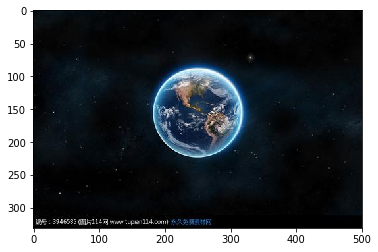

In [16]:
plt.imshow(image/255.)

In [0]:
%%time

i = 4   # i = 5 需要4G内存
result = recursive_dream(layers[i], image)

plt.imshow(result / 255.)
plt.show()

imsave('imgs/%s.jpg' % layer_names[i], result)

In [0]:
img = image.copy()
imgs = []

In [0]:
%%time

i = 0
    
print('Iteration %d of mixed4c' % i)
img = recursive_dream(layers[7], img)
# plt.figure(figsize=(10, 15))
plt.imshow(img / 255.)
plt.show()
imgs.append(img)

Iteration 0 of mixed4c


In [0]:
imsave('imgs/mixed4c%s.jpg' % layer_names[i], img)

Lossy conversion from float32 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


In [0]:
mimsave('imgs/mixed4c多轮迭代结果.gif', imgs, fps=5)

In [0]:
import os
os.mkdir('imgs')

conv2d0


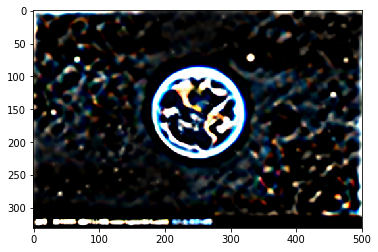

4.9348790645599365
conv2d1


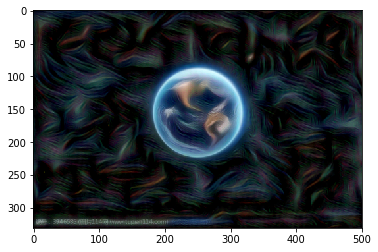

5.753353118896484
conv2d2


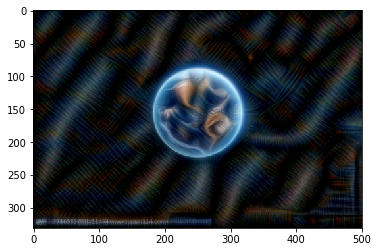

9.360888481140137
mixed3a


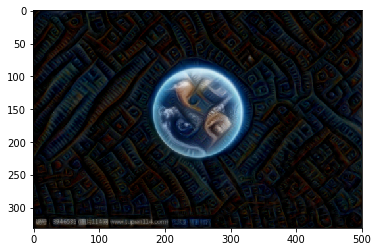

12.85245680809021
mixed3b


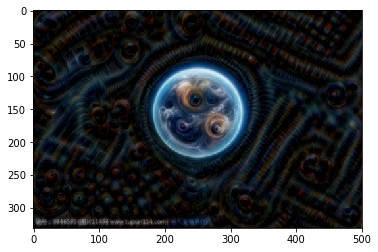

16.456503868103027
mixed4a


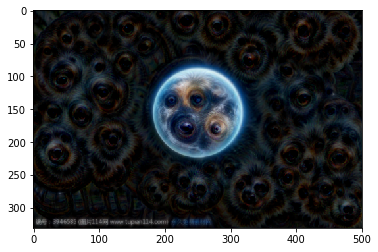

18.84139347076416
mixed4b


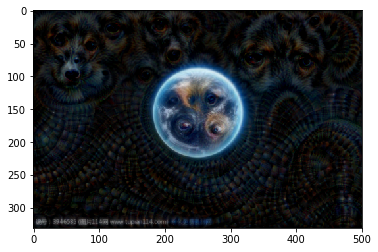

18.937639236450195
mixed4c


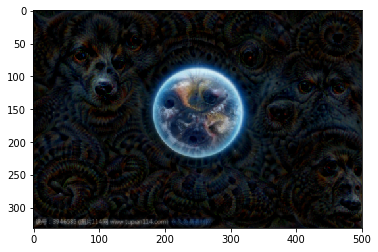

20.583242177963257
mixed4d


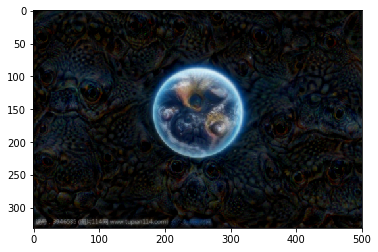

22.766154527664185
mixed4e


In [0]:
%%time

imgs = []
imgs.append(image)
for i in range(len(layers)):
    print(layer_names[i])
    t1 = time.time()
    
    result = recursive_dream(layers[i], image)
    # plt.figure(figsize=(10, 15))
    plt.imshow(result / 255.)
    plt.show()
    imsave('imgs/%s.jpg' % layer_names[i], result)
    
    t2 = time.time()
    print(t2-t1)
    imgs.append(result)
mimsave('各层多轮迭代结果.gif', imgs, fps=1)

Filter 0 of mixed4c


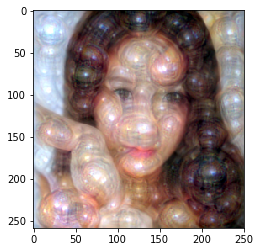

Lossy conversion from float32 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Filter 1 of mixed4c


In [0]:
%%time
imgs = []
imgs.append(image)
for i in range(20):
    print('Filter %d of mixed4c' % i)
    result = recursive_dream(layers[7][:, :, :, i], image)
    # plt.figure(figsize=(10, 15))
    plt.imshow(result / 255.)
    plt.show()
    imsave('imgs/mixed4c_filter_%d.jpg' % i, result)
    imgs.append(result)
mimsave('mixed4c多轮迭代结果.gif', imgs, fps=1)

Iteration 0 of mixed4c


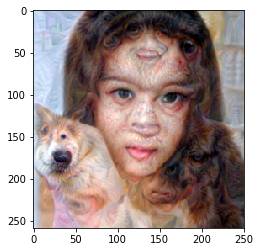

Iteration 1 of mixed4c


In [0]:
%%time
img = image.copy()
imgs = []
imgs.append(image)
for i in range(20):
    print('Iteration %d of mixed4c' % i)
    img = recursive_dream(layers[7], img)
    # plt.figure(figsize=(10, 15))
    plt.imshow(img / 255.)
    plt.show()
    imgs.append(img)
mimsave('mixed4c多轮迭代结果.gif', imgs, fps=5)

Iteration 0 of mixed4c


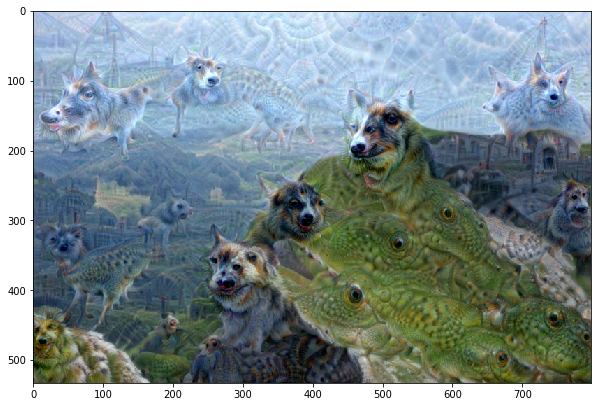

Iteration 1 of mixed4c


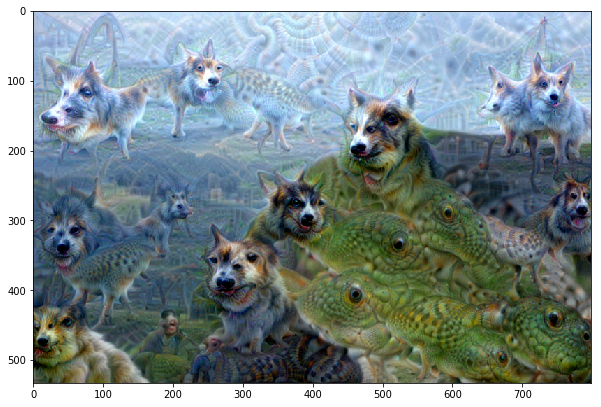

Iteration 2 of mixed4c


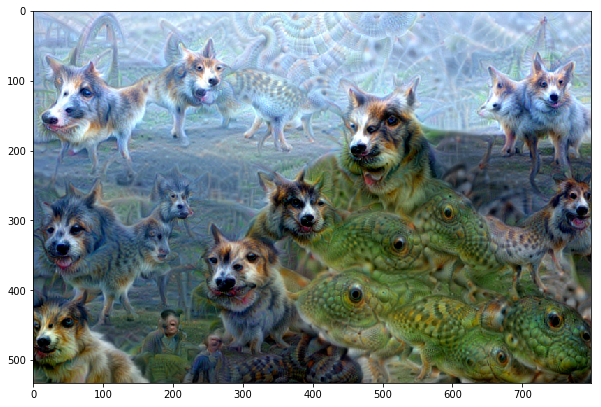

Iteration 3 of mixed4c


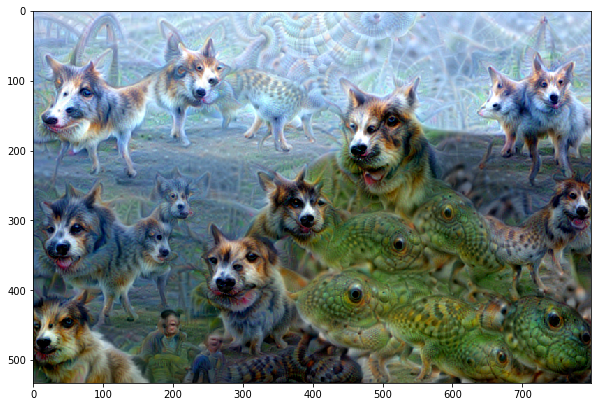

Iteration 4 of mixed4c


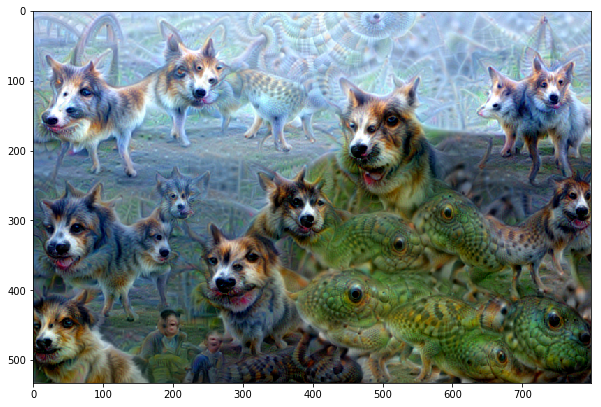

Iteration 5 of mixed4c


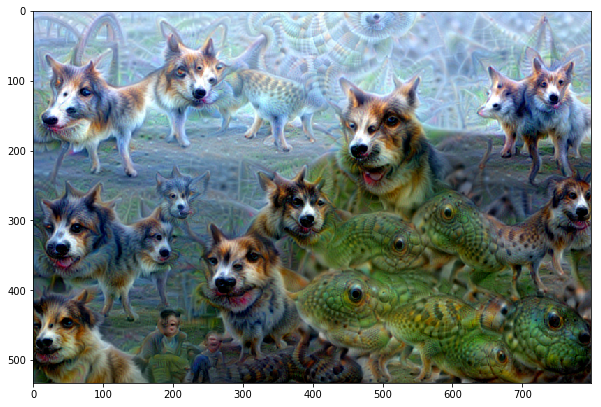

Iteration 6 of mixed4c


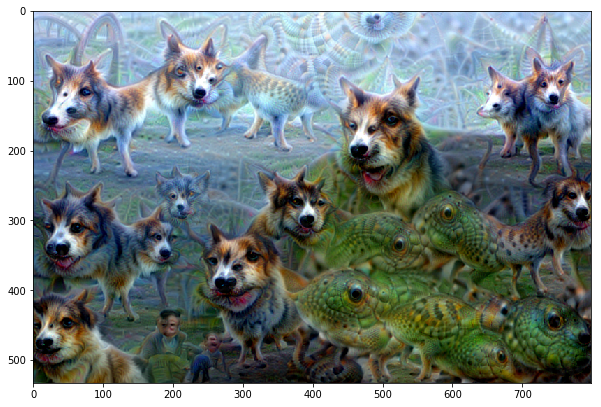

Iteration 7 of mixed4c


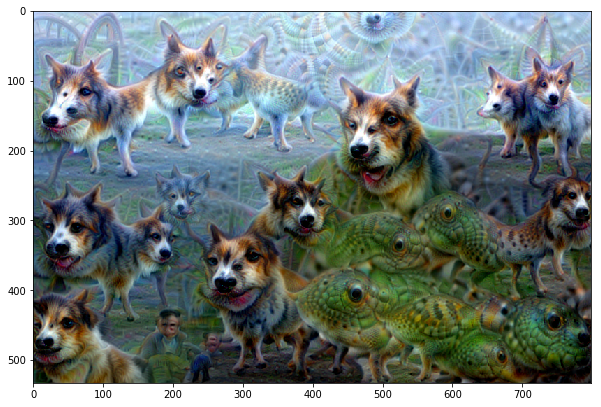

Iteration 8 of mixed4c


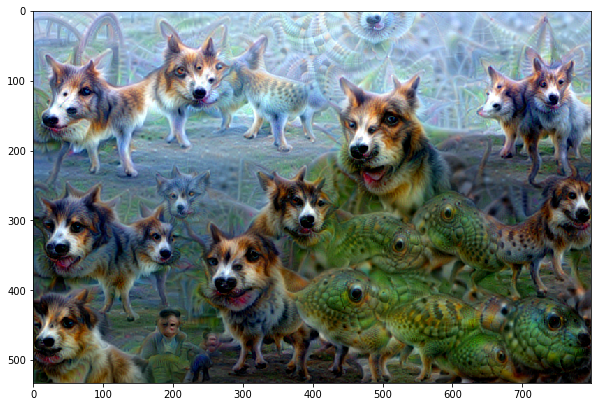

Iteration 9 of mixed4c


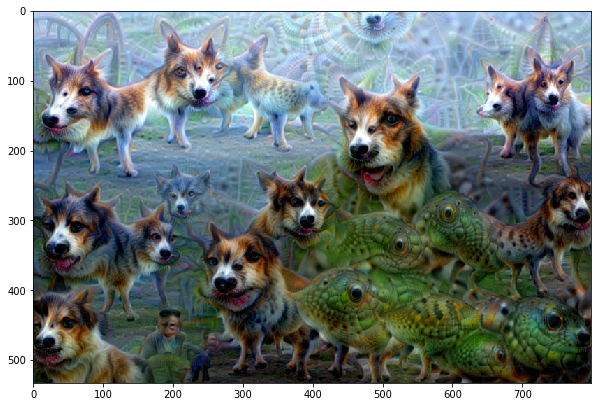

Iteration 10 of mixed4c


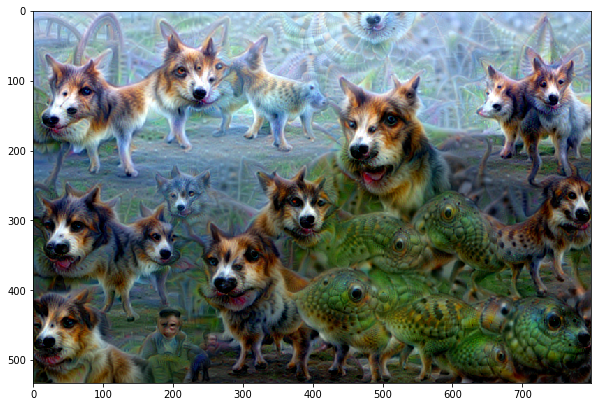

Iteration 11 of mixed4c


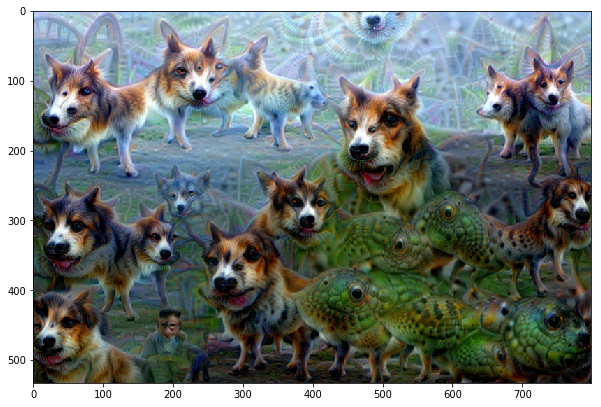

Iteration 12 of mixed4c


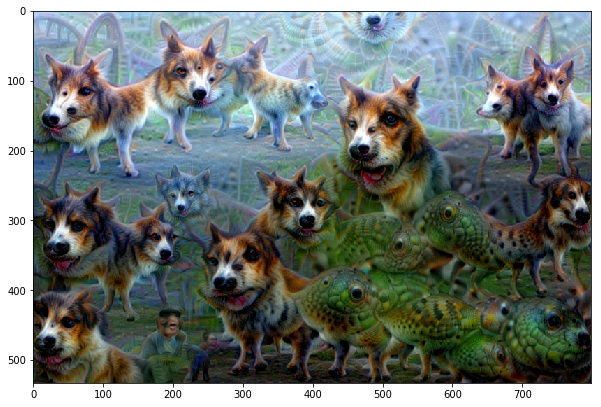

Iteration 13 of mixed4c


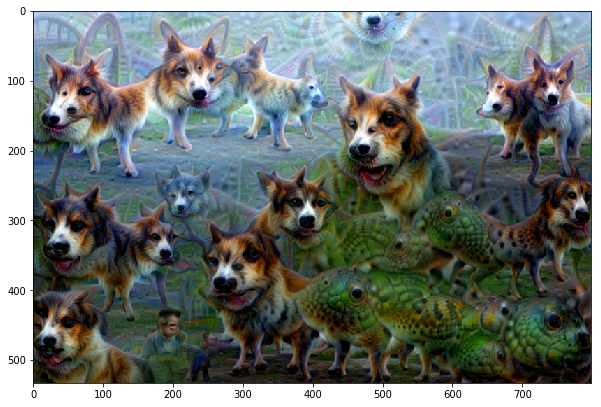

Iteration 14 of mixed4c


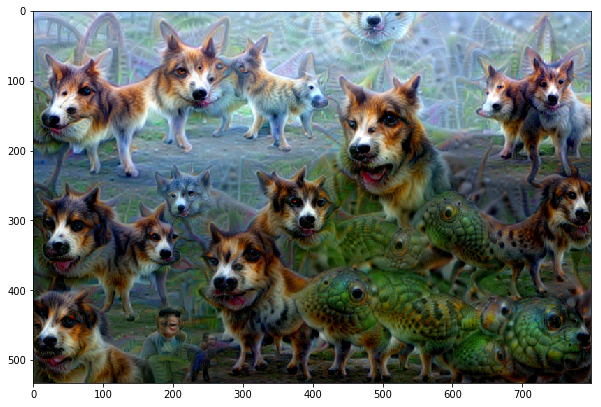

Iteration 15 of mixed4c


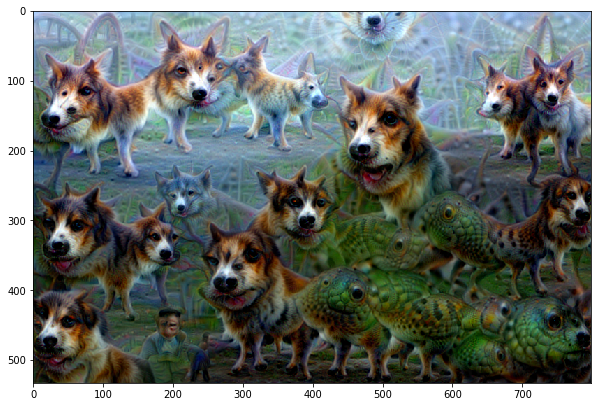

Iteration 16 of mixed4c


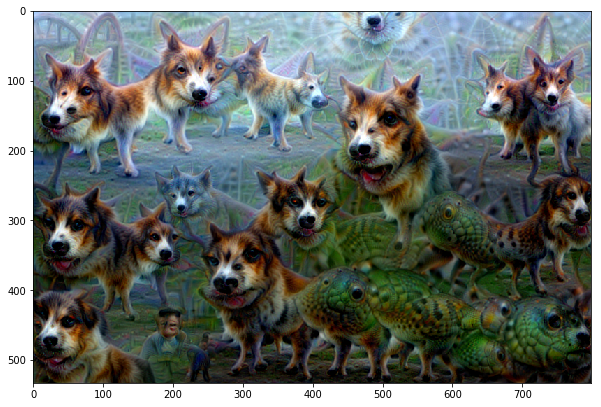

Iteration 17 of mixed4c


In [0]:
img = image.copy()
imgs = []
for i in range(20):
    print('Iteration %d of mixed4c' % i)
    img = recursive_dream(layers[7], img)
    plt.figure(figsize=(10, 15))
    plt.imshow(img / 255.)
    plt.show()
    imgs.append(img)
mimsave('imgs/mixed4c多轮迭代结果.gif', imgs, fps=5)